In [2]:
import s3fs, re, pyarrow.parquet as pq, pandas as pd, numpy as np
from s3_credentials import S3_ACCESS_KEY, S3_SECRET_KEY

OPTS={"key":S3_ACCESS_KEY,"secret":S3_SECRET_KEY,
      "client_kwargs":{"endpoint_url":"https://iseadocker.isea.rwth-aachen.de:9000","region_name":"us-east-1"},
      "config_kwargs":{"s3":{"addressing_style":"path"},"signature_version":"s3v4"}}
fs=s3fs.S3FileSystem(**OPTS)
RAWBASE="projects/j8005-metabatt/Metabatt/A123"
CAP="projects/j8005-metabatt/Metabatt/A123/40_capacity_monitore"
def TS(s): return pd.to_datetime(s, format='ISO8601')

BID="068"
# 从容量文件算3C阈值
cap=pd.read_csv(f"s3://{CAP}/METABatt_A123_APR18650M1B_{BID}_capacity.csv",
                storage_options=OPTS).dropna(subset=['Capacity_py'])
C_min=cap['Capacity_py'].min(); I_thresh=3*C_min*0.8
print(f"最低容量{C_min:.4f}Ah → 3C阈值{I_thresh:.3f}A")

# 读第一个aging文件
BASE=f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging=sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f])
with fs.open(aging[0]) as fh:
    d=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Zustand','Prozedur']).to_pandas()
d=d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
d['Zeit']=TS(d['Zeit'])   # 真实时间戳,不转换

# 切放电段:连续负3C电流
is_dch=(d['Strom'].values < -I_thresh)
diff=np.diff(is_dch.astype(int))
starts=np.where(diff==1)[0]+1; ends=np.where(diff==-1)[0]+1
if is_dch[0]: starts=np.r_[0,starts]
if is_dch[-1]: ends=np.r_[ends,len(d)]
segs=[(s,e) for s,e in zip(starts,ends) if e-s>=10]
print(f"\n切出 {len(segs)} 个放电段\n")

# 看前8段:真实时间 + 电压范围 + 时长
print(f"{'段':>3} {'开始时间':>20} {'时长(s)':>8} {'电压起→止':>16} {'最低V':>7} {'电流均值':>8}")
for k in range(min(8,len(segs))):
    s,e=segs[k]; seg=d.iloc[s:e]
    t_start=seg['Zeit'].iloc[0]
    dur=(seg['Zeit'].iloc[-1]-seg['Zeit'].iloc[0]).total_seconds()
    V=seg['Spannung'].values; I=seg['Strom'].values
    print(f"{k:>3} {str(t_start):>20} {dur:>8.0f} {V[0]:>7.3f}→{V[-1]:>6.3f} {V.min():>7.3f} {I.mean():>8.3f}")

最低容量1.0424Ah → 3C阈值2.502A

切出 520 个放电段

  段                 开始时间    时长(s)            电压起→止     最低V     电流均值
  0 2024-12-20 23:25:27.330000+00:00      240   3.209→ 2.480   2.480   -3.578
  1 2024-12-21 00:03:28.630000+00:00      240   3.209→ 2.484   2.484   -3.578
  2 2024-12-21 00:41:29.910000+00:00      240   3.210→ 2.487   2.487   -3.578
  3 2024-12-21 01:19:31.180000+00:00      240   3.211→ 2.494   2.494   -3.578
  4 2024-12-21 01:57:32.430000+00:00      240   3.210→ 2.503   2.503   -3.578
  5 2024-12-21 02:35:33.580000+00:00      240   3.211→ 2.509   2.509   -3.578
  6 2024-12-21 03:13:34.890000+00:00      240   3.211→ 2.514   2.514   -3.578
  7 2024-12-21 03:51:36.200000+00:00      240   3.211→ 2.522   2.522   -3.578


In [5]:
import s3fs, re, pyarrow.parquet as pq, pandas as pd, numpy as np
import plotly.graph_objects as go
from s3_credentials import S3_ACCESS_KEY, S3_SECRET_KEY

OPTS={"key":S3_ACCESS_KEY,"secret":S3_SECRET_KEY,
      "client_kwargs":{"endpoint_url":"https://iseadocker.isea.rwth-aachen.de:9000","region_name":"us-east-1"},
      "config_kwargs":{"s3":{"addressing_style":"path"},"signature_version":"s3v4"}}
fs=s3fs.S3FileSystem(**OPTS)
RAWBASE="projects/j8005-metabatt/Metabatt/A123"
CAP="projects/j8005-metabatt/Metabatt/A123/40_capacity_monitore"
def TS(s): return pd.to_datetime(s, format='ISO8601')

BID="074"

# 1. 3C阈值
cap=pd.read_csv(f"s3://{CAP}/METABatt_A123_APR18650M1B_{BID}_capacity.csv",
                storage_options=OPTS).dropna(subset=['Capacity_py'])
I_thresh=3*cap['Capacity_py'].min()*0.8
print(f"3C阈值: {I_thresh:.3f}A")

# 2. aging文件按日期排序
BASE=f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging=sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f])
def fdate(f):
    m=re.search(r'(\d{4}-\d{2}-\d{2})',f.split('/')[-1]); return pd.to_datetime(m.group(1)) if m else None
aging=sorted(aging, key=fdate)
print(f"{len(aging)}个aging文件")

# 3. 逐文件切放电段,只保留每段的摘要(省内存)
seg_records=[]   # 每个放电段一条记录
for fi,f in enumerate(aging):
    with fs.open(f) as fh:
        d=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Prozedur']).to_pandas()
    d=d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
    if len(d)==0: continue
    d['Zeit']=TS(d['Zeit'])
    is_dch=(d['Strom'].values<-I_thresh)
    diff=np.diff(is_dch.astype(int))
    starts=np.where(diff==1)[0]+1; ends=np.where(diff==-1)[0]+1
    if is_dch[0]: starts=np.r_[0,starts]
    if is_dch[-1]: ends=np.r_[ends,len(d)]
    for s,e in zip(starts,ends):
        if e-s<10: continue
        seg=d.iloc[s:e]
        V=seg['Spannung'].values; I=seg['Strom'].values
        seg_records.append({
            'file':fi,
            't_start':seg['Zeit'].iloc[0],
            'dur_s':(seg['Zeit'].iloc[-1]-seg['Zeit'].iloc[0]).total_seconds(),
            'V_start':V[0], 'V_end':V[-1], 'V_min':V.min(), 'V_max':V.max(),
            'I_mean':I.mean(), 'n':len(seg)
        })
    print(f"  file{fi} ({fdate(f).date()}): 累计{len(seg_records)}段")

seg_df=pd.DataFrame(seg_records).sort_values('t_start').reset_index(drop=True)
print(f"\n共 {len(seg_df)} 个放电段")
print(f"全寿命时间: {seg_df['t_start'].min()} → {seg_df['t_start'].max()}")

# 4. 画全局:每个放电段的V_min随时间(看寿命演化、暴露矛盾)
fig=go.Figure()
fig.add_trace(go.Scatter(x=seg_df['t_start'], y=seg_df['V_min'], mode='markers',
    marker=dict(size=4,color=seg_df['file'],colorscale='Viridis',showscale=True,
                colorbar=dict(title='file')),
    name='V_min',
    hovertemplate='%{x|%Y-%m-%d %H:%M}<br>V_min=%{y:.3f}V<extra></extra>'))
fig.update_layout(height=500,width=1300,
    title=f'Cell {BID} — discharge V_min over full lifetime (each point = one discharge)',
    xaxis_title='Time', yaxis_title='Discharge V_min (V)')
fig.show()

# 也看V_end和电流,确认一致性
print("\n各文件放电段的电压/电流概览:")
print(seg_df.groupby('file').agg(
    n_seg=('t_start','count'),
    V_min_mean=('V_min','mean'),
    I_mean=('I_mean','mean'),
    dur_mean=('dur_s','mean')
).round(3).to_string())

3C阈值: 2.409A
26个aging文件
  file0 (2024-11-17): 累计430段
  file1 (2024-12-05): 累计860段
  file2 (2024-12-23): 累计1290段
  file3 (2025-01-10): 累计1720段
  file4 (2025-01-30): 累计2150段
  file5 (2025-02-16): 累计2580段
  file6 (2025-03-07): 累计3010段
  file7 (2025-03-24): 累计3440段
  file8 (2025-04-26): 累计3870段
  file9 (2025-05-14): 累计4300段
  file10 (2025-06-05): 累计4730段
  file11 (2025-06-22): 累计5160段
  file12 (2025-07-11): 累计5590段
  file13 (2025-07-28): 累计6020段
  file14 (2025-08-16): 累计6450段
  file15 (2025-09-02): 累计6880段
  file16 (2025-09-20): 累计7310段
  file17 (2025-10-07): 累计7740段
  file18 (2025-10-24): 累计8170段
  file19 (2025-11-10): 累计8600段
  file20 (2025-11-28): 累计9030段
  file21 (2025-12-15): 累计9460段
  file22 (2026-01-01): 累计9890段
  file23 (2026-01-18): 累计10320段
  file24 (2026-02-07): 累计10750段
  file25 (2026-02-24): 累计11180段

共 11180 个放电段
全寿命时间: 2024-11-18 03:28:51.750000+00:00 → 2026-03-10 11:22:59.930000+00:00



各文件放电段的电压/电流概览:
      n_seg  V_min_mean  I_mean  dur_mean
file                                     
0       430       2.867  -3.595   480.080
1       430       2.796  -3.632   479.254
2       430       2.660  -3.617   480.093
3       430       2.558  -3.566   480.095
4       430       2.605  -3.483   480.101
5       430       2.614  -3.436   480.096
6       430       2.655  -3.400   480.108
7       430       2.672  -3.374   480.097
8       430       2.705  -3.348   480.089
9       430       2.593  -3.344   480.085
10      430       2.650  -3.350   480.059
11      430       2.689  -3.320   480.081
12      430       2.706  -3.280   480.081
13      430       2.531  -3.271   480.057
14      430       2.620  -3.298   480.088
15      430       2.674  -3.249   480.086
16      430       2.671  -3.215   480.045
17      430       2.703  -3.203   480.077
18      430       2.614  -3.182   480.093
19      430       2.611  -3.178   480.091
20      430       2.697  -3.156   480.046
21      430      

In [6]:
import s3fs, re, pyarrow.parquet as pq, pandas as pd, numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from s3_credentials import S3_ACCESS_KEY, S3_SECRET_KEY

OPTS={"key":S3_ACCESS_KEY,"secret":S3_SECRET_KEY,
      "client_kwargs":{"endpoint_url":"https://iseadocker.isea.rwth-aachen.de:9000","region_name":"us-east-1"},
      "config_kwargs":{"s3":{"addressing_style":"path"},"signature_version":"s3v4"}}
fs=s3fs.S3FileSystem(**OPTS)
RAWBASE="projects/j8005-metabatt/Metabatt/A123"
def TS(s): return pd.to_datetime(s, format='ISO8601')

BID="074"
BASE=f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging=sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f])
def fdate(f):
    m=re.search(r'(\d{4}-\d{2}-\d{2})',f.split('/')[-1]); return pd.to_datetime(m.group(1)) if m else None

# 找包含2025-01-10的aging文件(文件日期最接近且<=该日期的)
target=pd.to_datetime("2025-01-10")
cand=[(fi,fdate(f)) for fi,f in enumerate(aging)]
# 找日期<=目标且最近的文件(数据可能跨到下一个文件,所以前后都读)
fi_near=min(range(len(aging)), key=lambda i: abs((fdate(aging[i])-target).days))
print(f"最接近2025-01-10的文件: file{fi_near} ({fdate(aging[fi_near]).date()})")

# 读这个文件(以及它前后各一个,防止跨文件)
read_idxs=[i for i in [fi_near-1,fi_near,fi_near+1] if 0<=i<len(aging)]
parts=[]
for i in read_idxs:
    with fs.open(aging[i]) as fh:
        d=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Zustand','Prozedur']).to_pandas()
    d=d[d['Prozedur'].str.contains('Aging_APR_Cyc')]
    d['Zeit']=TS(d['Zeit'])
    parts.append(d)
    print(f"  读file{i} ({fdate(aging[i]).date()}): {len(d)}行, 时间{d['Zeit'].min()}~{d['Zeit'].max()}")
d=pd.concat(parts).sort_values('Zeit').reset_index(drop=True)

# 锁定2025-01-10附近(前后各6小时)
t0=pd.Timestamp("2025-01-10 00:00:00",tz="UTC")
t1=pd.Timestamp("2025-01-11 00:00:00",tz="UTC")
win=d[(d['Zeit']>=t0)&(d['Zeit']<=t1)]
print(f"\n2025-01-10当天: {len(win)}行")
if len(win)>0:
    print(f"电压范围: {win['Spannung'].min():.3f}~{win['Spannung'].max():.3f}V")
    print(f"电流范围: {win['Strom'].min():.3f}~{win['Strom'].max():.3f}A")
    print(f"状态: {win['Zustand'].unique()}")
    print(f"程序: {win['Prozedur'].unique()}")
    # 找最低电压点的详情
    imin=win['Spannung'].idxmin()
    print(f"\n最低电压点:")
    print(win.loc[imin].to_string())
    # 最低点附近20个点
    pos=win.index.get_loc(imin)
    print(f"\n最低点前后10个点:")
    print(win.iloc[max(0,pos-10):pos+10][['Zeit','Spannung','Strom','Zustand','Prozedur']].to_string())

# 画当天完整波形
fig=make_subplots(rows=2,cols=1,shared_xaxes=True,vertical_spacing=0.06,
                  subplot_titles=('Current (A)','Voltage (V)'))
fig.add_trace(go.Scatter(x=win['Zeit'],y=win['Strom'],mode='lines+markers',
    line=dict(color='#4A90D9',width=1),marker=dict(size=3),name='I',
    hovertemplate='%{x|%H:%M:%S}<br>I=%{y:.3f}A<extra></extra>'),row=1,col=1)
fig.add_trace(go.Scatter(x=win['Zeit'],y=win['Spannung'],mode='lines+markers',
    line=dict(color='#E8669E',width=1),marker=dict(size=3),name='U',
    hovertemplate='%{x|%H:%M:%S}<br>U=%{y:.4f}V<extra></extra>'),row=2,col=1)
fig.add_hline(y=2.5,line=dict(color='orange',dash='dash'),row=2,col=1)
fig.update_layout(height=700,width=1300,hovermode='x unified',
    title=f'Cell {BID} — 2025-01-10 full day (the 2.1V anomaly)')
fig.update_yaxes(title_text='I (A)',row=1,col=1); fig.update_yaxes(title_text='U (V)',row=2,col=1)
fig.show()

最接近2025-01-10的文件: file3 (2025-01-10)
  读file2 (2024-12-23): 1696284行, 时间2024-12-23 15:23:52.470000+00:00~2025-01-06 18:47:29.560000+00:00
  读file3 (2025-01-10): 1705133行, 时间2025-01-10 05:17:29.030000+00:00~2025-01-24 08:36:43.430000+00:00
  读file4 (2025-01-30): 1701802行, 时间2025-01-30 13:03:54.110000+00:00~2025-02-13 16:23:11.460000+00:00

2025-01-10当天: 85496行
电压范围: 1.997~3.600V
电流范围: -3.566~3.566A
状态: ['PAUO' 'REST' 'PAU' 'CHA' 'DCH']
程序: ['jri_Aging_APR_Cyc_25grad_70SOC_40DOD_3C']

最低电压点:
Zeit               2025-01-10 15:04:12.260000+00:00
Spannung                                    1.99685
Strom                                     -3.565628
Zustand                                         DCH
Prozedur    jri_Aging_APR_Cyc_25grad_70SOC_40DOD_3C

最低点前后10个点:
                                    Zeit  Spannung     Strom Zustand                                 Prozedur
1735692 2025-01-10 15:04:10.400000+00:00  2.069564 -3.565628     DCH  jri_Aging_APR_Cyc_25grad_70SOC_40DOD_3C
1735693 2025-

In [7]:
import s3fs, re, pyarrow.parquet as pq, pandas as pd, numpy as np
from s3_credentials import S3_ACCESS_KEY, S3_SECRET_KEY

OPTS={"key":S3_ACCESS_KEY,"secret":S3_SECRET_KEY,
      "client_kwargs":{"endpoint_url":"https://iseadocker.isea.rwth-aachen.de:9000","region_name":"us-east-1"},
      "config_kwargs":{"s3":{"addressing_style":"path"},"signature_version":"s3v4"}}
fs=s3fs.S3FileSystem(**OPTS)
BID="068"
BASE=f"projects/j8005-metabatt/Metabatt/A123/METABatt_A123_APR18650M1B_{BID}"
aging=sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f])
def fdate(f):
    m=re.search(r'(\d{4}-\d{2}-\d{2})',f.split('/')[-1]); return pd.to_datetime(m.group(1))

# 找含2025-02-21的文件,前后各读一个
target=pd.to_datetime("2025-02-21")
fi=min(range(len(aging)),key=lambda i:abs((fdate(aging[i])-target).days))
parts=[]
for i in [fi-1,fi,fi+1]:
    if 0<=i<len(aging):
        with fs.open(aging[i]) as fh:
            d=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Zustand','Prozedur']).to_pandas()
        d['Zeit']=pd.to_datetime(d['Zeit'],format='ISO8601')
        parts.append(d)
d=pd.concat(parts).sort_values('Zeit').reset_index(drop=True)

# 锁定21号当天
t0=pd.Timestamp("2025-02-21 00:00:00",tz="UTC")
t1=pd.Timestamp("2025-02-22 00:00:00",tz="UTC")
win=d[(d['Zeit']>=t0)&(d['Zeit']<=t1)].reset_index(drop=True)

# 存成csv方便你逐行看
win.to_csv(f'{BID}_2025-02-21.csv',index=False)
print(f"21号当天 {len(win)}行, 已存 {BID}_2025-02-21.csv")
print(f"电压范围: {win['Spannung'].min():.3f}~{win['Spannung'].max():.3f}V")

# 只看这个具体工况的行
proc_name = 'jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C'
cyc = win[win['Prozedur'] == proc_name].reset_index(drop=True)
print(f"\n{proc_name} 共 {len(cyc)} 行")
print(f"电压范围: {cyc['Spannung'].min():.3f} ~ {cyc['Spannung'].max():.3f}V")

# 打印最低电压附近
imin = cyc['Spannung'].idxmin()
print(f"\n最低电压 {cyc.loc[imin,'Spannung']:.3f}V at {cyc.loc[imin,'Zeit']}")
print(cyc.iloc[max(0,imin-30):imin+15][['Zeit','Spannung','Strom','Zustand','Prozedur']].to_string())

21号当天 79436行, 已存 068_2025-02-21.csv
电压范围: 1.999~3.600V

jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C 共 75161 行
电压范围: 2.152 ~ 3.600V

最低电压 2.152V at 2025-02-21 15:16:34.990000+00:00
                                  Zeit  Spannung    Strom Zustand                                 Prozedur
34423 2025-02-21 15:16:30.150000+00:00  2.376012 -3.56450     DCH  jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C
34424 2025-02-21 15:16:30.440000+00:00  2.365228 -3.56450     DCH  jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C
34425 2025-02-21 15:16:30.620000+00:00  2.358113 -3.56450     DCH  jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C
34426 2025-02-21 15:16:30.750000+00:00  2.353443 -3.56450     DCH  jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C
34427 2025-02-21 15:16:30.870000+00:00  2.347773 -3.56450     DCH  jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C
34428 2025-02-21 15:16:30.990000+00:00  2.342882 -3.56450     DCH  jri_Aging_APR_Cyc_35grad_30SOC_20DOD_3C
34429 2025-02-21 15:16:31.300000+00:00  2.331320 -3.56450     DCH  jri_Agin

Cell 147: C_min=0.825 Ah, 3C threshold=1.98 A
file: J8005_BMWK_METABatt=METABatt_A123_APR18650M1B_147=2024-09-09_142905=jri_Aging_APR_Cyc_35grad_50SOC_100DOD_3C=TS012570 _ Format01=Kreis M8-022=filesize-86024016=finished.parquet
detected 286 discharge segments in this file


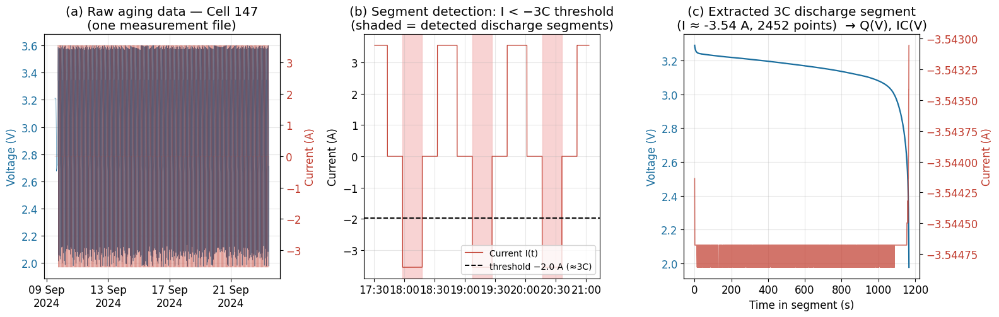

saved raw_to_segment.png


In [8]:
# ============================================================
# PPT figure: Raw data -> 3C discharge segment extraction
# 3 panels: (a) raw V/I overview with dates
#           (b) zoom: threshold detection, segments shaded
#           (c) one extracted 3C discharge segment
# 前置:与 extract_X_single 相同的环境(fs, OPTS, RAWBASE, CAP, TS 已定义)
# ============================================================
import re, numpy as np, pandas as pd
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# -------- 可调 --------
BID      = "147"     # 展示用电池(DOD=100,峰最清楚,与slide14/15呼应)
FILE_IDX = 0         # 用第几个aging文件做展示(0=最早)
ZOOM_N   = 3         # 放大窗里显示几个放电段
MIN_SEG  = 10
DOWNSAMPLE = 20      # 总览图降采样倍数(画图提速,不影响检测)
# ----------------------

# 1) 阈值:与提取代码完全一致
cap = pd.read_csv(f"s3://{CAP}/METABatt_A123_APR18650M1B_{BID}_capacity.csv",
                  storage_options=OPTS)
C_min = cap.dropna(subset=['Capacity_py'])['Capacity_py'].min()
I_thresh = 3 * C_min * 0.8
print(f"Cell {BID}: C_min={C_min:.3f} Ah, 3C threshold={I_thresh:.2f} A")

# 2) 读一个aging文件
BASE = f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging = sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f],
               key=lambda f: re.search(r'(\d{4}-\d{2}-\d{2})', f.split('/')[-1]).group(1))
f = aging[FILE_IDX]
print("file:", f.split('/')[-1])
with fs.open(f) as fh:
    d = pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Prozedur']).to_pandas()
d = d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
d['Zeit'] = TS(d['Zeit'])

# 3) 放电段检测:与提取代码完全一致
is_dch = (d['Strom'].values < -I_thresh)
diff = np.diff(is_dch.astype(int))
starts = np.where(diff==1)[0]+1; ends = np.where(diff==-1)[0]+1
if is_dch[0]:  starts = np.r_[0, starts]
if is_dch[-1]: ends   = np.r_[ends, len(d)]
segs = [(s,e) for s,e in zip(starts,ends) if e-s >= MIN_SEG]
print(f"detected {len(segs)} discharge segments in this file")

# ================= 画图 =================
plt.rcParams.update({'font.size': 12})
fig = plt.figure(figsize=(16, 5.2))
C_V, C_I, C_SEG = '#1a6e9e', '#c0392b', '#f4b6b6'

# ---------- (a) 总览:V/I vs 日期 ----------
ax1 = fig.add_subplot(1, 3, 1)
ds = d.iloc[::DOWNSAMPLE]
ax1.plot(ds['Zeit'], ds['Spannung'], color=C_V, lw=0.4)
ax1.set_ylabel('Voltage (V)', color=C_V)
ax1.tick_params(axis='y', labelcolor=C_V)
ax1b = ax1.twinx()
ax1b.plot(ds['Zeit'], ds['Strom'], color=C_I, lw=0.3, alpha=0.6)
ax1b.set_ylabel('Current (A)', color=C_I)
ax1b.tick_params(axis='y', labelcolor=C_I)
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d %b\n%Y'))
ax1.xaxis.set_major_locator(mdates.AutoDateLocator(maxticks=5))
ax1.set_title(f'(a) Raw aging data — Cell {BID}\n(one measurement file)')
ax1.grid(alpha=0.3)

# ---------- (b) 放大:阈值检测过程 ----------
# 取前 ZOOM_N 个段附近的窗口
z0 = max(segs[0][0] - (segs[0][1]-segs[0][0]), 0)
z1 = min(segs[min(ZOOM_N,len(segs))-1][1] + (segs[0][1]-segs[0][0]), len(d))
dz = d.iloc[z0:z1]
ax2 = fig.add_subplot(1, 3, 2)
ax2.plot(dz['Zeit'], dz['Strom'], color=C_I, lw=0.9, label='Current I(t)')
ax2.axhline(-I_thresh, color='k', ls='--', lw=1.4,
            label=f'threshold −{I_thresh:.1f} A (≈3C)')
for (s,e) in segs[:ZOOM_N]:
    ax2.axvspan(d['Zeit'].iloc[s], d['Zeit'].iloc[min(e,len(d)-1)],
                color=C_SEG, alpha=0.6)
ax2.set_ylabel('Current (A)')
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax2.set_title('(b) Segment detection: I < −3C threshold\n(shaded = detected discharge segments)')
ax2.legend(loc='lower right', fontsize=10)
ax2.grid(alpha=0.3)

# ---------- (c) 提取出的单个3C放电段 ----------
s, e = segs[0]
seg = d.iloc[s:e]
t = (seg['Zeit'] - seg['Zeit'].iloc[0]).dt.total_seconds().values
ax3 = fig.add_subplot(1, 3, 3)
ax3.plot(t, seg['Spannung'], color=C_V, lw=1.6, label='Voltage')
ax3.set_xlabel('Time in segment (s)')
ax3.set_ylabel('Voltage (V)', color=C_V)
ax3.tick_params(axis='y', labelcolor=C_V)
ax3b = ax3.twinx()
ax3b.plot(t, seg['Strom'], color=C_I, lw=1.2, alpha=0.7, label='Current')
ax3b.set_ylabel('Current (A)', color=C_I)
ax3b.tick_params(axis='y', labelcolor=C_I)
Imean = seg['Strom'].mean()
ax3.set_title(f'(c) Extracted 3C discharge segment\n(I ≈ {Imean:.2f} A, {len(seg)} points)'
              f'  → Q(V), IC(V)')
ax3.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('raw_to_segment.png', dpi=200, bbox_inches='tight')
plt.show()
print("saved raw_to_segment.png")

In [ ]:
import s3fs, re, pyarrow.parquet as pq, pandas as pd, numpy as np
from s3_credentials import S3_ACCESS_KEY, S3_SECRET_KEY

OPTS={"key":S3_ACCESS_KEY,"secret":S3_SECRET_KEY,
      "client_kwargs":{"endpoint_url":"https://iseadocker.isea.rwth-aachen.de:9000","region_name":"us-east-1"},
      "config_kwargs":{"s3":{"addressing_style":"path"},"signature_version":"s3v4"}}
fs=s3fs.S3FileSystem(**OPTS)
RAWBASE="projects/j8005-metabatt/Metabatt/A123"
CAP="projects/j8005-metabatt/Metabatt/A123/40_capacity_monitore"
def TS(s): return pd.to_datetime(s,format='ISO8601')

BID="066"   # ← 换电池号

# 3C阈值
cap=pd.read_csv(f"s3://{CAP}/METABatt_A123_APR18650M1B_{BID}_capacity.csv",
                storage_options=OPTS).dropna(subset=['Capacity_py'])
I_thresh=3*cap['Capacity_py'].min()*0.8

BASE=f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging=sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f])
def fdate(f):
    m=re.search(r'(\d{4}-\d{2}-\d{2})',f.split('/')[-1]); return pd.to_datetime(m.group(1))
aging=sorted(aging,key=fdate)
cond=re.search(r'(\d+grad_\d+SOC_\d+DOD_\d+C)',aging[0]).group(1)
print(f"Cell {BID} ({cond}), 3C阈值{I_thresh:.3f}A, {len(aging)}文件\n")

# 逐文件:找3C放电段的最低电压
print(f"{'file':>4} {'日期':>12} {'放电段数':>8} {'最低V':>8} {'<2.5的段':>8}")
low_found=[]
for fi,f in enumerate(aging):
    with fs.open(f) as fh:
        d=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Prozedur']).to_pandas()
    d=d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
    if len(d)==0: continue
    d['Zeit']=TS(d['Zeit'])
    is_dch=(d['Strom'].values<-I_thresh)
    diff=np.diff(is_dch.astype(int))
    starts=np.where(diff==1)[0]+1; ends=np.where(diff==-1)[0]+1
    if is_dch[0]: starts=np.r_[0,starts]
    if is_dch[-1]: ends=np.r_[ends,len(d)]
    segs=[(s,e) for s,e in zip(starts,ends) if e-s>=10]
    if not segs: continue
    vmins=[d['Spannung'].iloc[s:e].min() for s,e in segs]
    vmin_file=min(vmins)
    n_low=sum(1 for v in vmins if v<2.5)
    print(f"{fi:>4} {str(fdate(f).date()):>12} {len(segs):>8} {vmin_file:>8.3f} {n_low:>8}")
    if vmin_file<2.5:
        low_found.append((fi,fdate(f).date(),vmin_file))

print(f"\n{'='*40}")
if low_found:
    print(f"⚠️ 有 {len(low_found)} 个文件出现放电电压<2.5V:")
    for fi,dt,v in low_found:
        print(f"  file{fi} ({dt}): 最低{v:.3f}V")
else:
    print("✓ 没有放电电压<2.5V的情况")

Cell 066 (35grad_70SOC_20DOD_3C), 3C阈值2.475A, 21文件

file           日期     放电段数      最低V   <2.5的段
   0   2024-12-20      520    2.458        6
   1   2025-01-08      520    2.273       24
   2   2025-01-31      520    2.235       34
   3   2025-02-18      520    2.182       32
   4   2025-03-12      520    2.261       22
   5   2025-03-31      520    2.259       24
   6   2025-04-20      520    2.250       26
   7   2025-05-08      520    2.259       25
   8   2025-05-27      520    2.259       22
   9   2025-06-15      520    2.280       18
  10   2025-07-06      520    2.282       17
  11   2025-07-29      520    2.284       14


In [ ]:
import s3fs, re, pyarrow.parquet as pq, pandas as pd, numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from s3_credentials import S3_ACCESS_KEY, S3_SECRET_KEY

OPTS={"key":S3_ACCESS_KEY,"secret":S3_SECRET_KEY,
      "client_kwargs":{"endpoint_url":"https://iseadocker.isea.rwth-aachen.de:9000","region_name":"us-east-1"},
      "config_kwargs":{"s3":{"addressing_style":"path"},"signature_version":"s3v4"}}
fs=s3fs.S3FileSystem(**OPTS)

BID="066"
BASE=f"projects/j8005-metabatt/Metabatt/A123/METABatt_A123_APR18650M1B_{BID}"
aging=sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f],
             key=lambda f: re.search(r'(\d{4}-\d{2}-\d{2})',f.split('/')[-1]).group(1))

with fs.open(aging[3]) as fh:
    d=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Zustand','Prozedur']).to_pandas()
d=d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
d['Zeit']=pd.to_datetime(d['Zeit'],format='ISO8601')

imin=d['Spannung'].idxmin()
sub=d.iloc[max(0,imin-3000):imin+1000]
print(f"最低电压 {d.loc[imin,'Spannung']:.3f}V at {d.loc[imin,'Zeit']}")

# ===== 输出这些行 =====
pd.set_option('display.max_rows', None)   # 不省略,全部显示
print(sub[['Zeit','Spannung','Strom','Zustand','Prozedur']].to_string())

# 存csv方便Excel看
sub.to_csv(f'{BID}_file3_minV.csv', index=False)
print(f"\n已存 {BID}_file3_minV.csv ({len(sub)}行)")

# ===== 画图 =====
fig=make_subplots(rows=2,cols=1,shared_xaxes=True,vertical_spacing=0.06,
                  subplot_titles=('Current (A)','Voltage (V)'))
fig.add_trace(go.Scatter(x=sub['Zeit'],y=sub['Strom'],mode='lines+markers',
    line=dict(color='#4A90D9',width=1),marker=dict(size=4),name='I',
    hovertemplate='%{x|%H:%M:%S}<br>I=%{y:.3f}A<extra></extra>'),row=1,col=1)
fig.add_trace(go.Scatter(x=sub['Zeit'],y=sub['Spannung'],mode='lines+markers',
    line=dict(color='#E8669E',width=1),marker=dict(size=4),name='U',
    hovertemplate='%{x|%H:%M:%S}<br>U=%{y:.4f}V<extra></extra>'),row=2,col=1)
fig.add_hline(y=2.5,line=dict(color='orange',dash='dash'),row=2,col=1)
fig.update_layout(height=700,width=1200,hovermode='x unified',
    title=f'Cell {BID} file3 (2025-02-18) — around min voltage 2.182V')
fig.update_yaxes(title_text='I (A)',row=1,col=1); fig.update_yaxes(title_text='U (V)',row=2,col=1)
fig.show()

最低电压 2.182V at 2025-02-19 17:37:55.530000+00:00
                                  Zeit  Spannung     Strom Zustand                                 Prozedur
31454 2025-02-19 17:06:50.130000+00:00  2.684267  0.000000    PAUO  jri_Aging_APR_Cyc_35grad_70SOC_20DOD_3C
31455 2025-02-19 17:06:51.030000+00:00  2.684267  0.000000    PAUO  jri_Aging_APR_Cyc_35grad_70SOC_20DOD_3C
31456 2025-02-19 17:06:51.120000+00:00  2.684378  0.000000    PAUO  jri_Aging_APR_Cyc_35grad_70SOC_20DOD_3C
31457 2025-02-19 17:06:52.060000+00:00  2.684378  0.000000    PAUO  jri_Aging_APR_Cyc_35grad_70SOC_20DOD_3C
31458 2025-02-19 17:06:52.150000+00:00  2.684378  0.000000    PAUO  jri_Aging_APR_Cyc_35grad_70SOC_20DOD_3C
31459 2025-02-19 17:06:53.060000+00:00  2.684378  0.000000    PAUO  jri_Aging_APR_Cyc_35grad_70SOC_20DOD_3C
31460 2025-02-19 17:06:53.150000+00:00  2.684378  0.000000    PAUO  jri_Aging_APR_Cyc_35grad_70SOC_20DOD_3C
31461 2025-02-19 17:06:54.050000+00:00  2.684378  0.000000    PAUO  jri_Aging_APR_Cyc_35

In [ ]:
# ============================================================
# PPT figure: Raw data -> 3C discharge segment extraction
# 3 panels: (a) raw V/I overview with dates
#           (b) zoom: threshold detection, segments shaded
#           (c) one extracted 3C discharge segment
# 前置:与 extract_X_single 相同的环境(fs, OPTS, RAWBASE, CAP, TS 已定义)
# ============================================================
import re, numpy as np, pandas as pd
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# -------- 可调 --------
BID      = "147"     # 展示用电池(DOD=100,峰最清楚,与slide14/15呼应)
FILE_IDX = 0         # 用第几个aging文件做展示(0=最早)
ZOOM_N   = 3         # 放大窗里显示几个放电段
MIN_SEG  = 10
DOWNSAMPLE = 20      # 总览图降采样倍数(画图提速,不影响检测)
# ----------------------

# 1) 阈值:与提取代码完全一致
cap = pd.read_csv(f"s3://{CAP}/METABatt_A123_APR18650M1B_{BID}_capacity.csv",
                  storage_options=OPTS)
C_min = cap.dropna(subset=['Capacity_py'])['Capacity_py'].min()
I_thresh = 3 * C_min * 0.8
print(f"Cell {BID}: C_min={C_min:.3f} Ah, 3C threshold={I_thresh:.2f} A")

# 2) 读一个aging文件
BASE = f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging = sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f],
               key=lambda f: re.search(r'(\d{4}-\d{2}-\d{2})', f.split('/')[-1]).group(1))
f = aging[FILE_IDX]
print("file:", f.split('/')[-1])
with fs.open(f) as fh:
    d = pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Prozedur']).to_pandas()
d = d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
d['Zeit'] = TS(d['Zeit'])

# 3) 放电段检测:与提取代码完全一致
is_dch = (d['Strom'].values < -I_thresh)
diff = np.diff(is_dch.astype(int))
starts = np.where(diff==1)[0]+1; ends = np.where(diff==-1)[0]+1
if is_dch[0]:  starts = np.r_[0, starts]
if is_dch[-1]: ends   = np.r_[ends, len(d)]
segs = [(s,e) for s,e in zip(starts,ends) if e-s >= MIN_SEG]
print(f"detected {len(segs)} discharge segments in this file")

# ================= 画图 =================
plt.rcParams.update({'font.size': 12})
fig = plt.figure(figsize=(16, 5.2))
C_V, C_I, C_SEG = '#1a6e9e', '#c0392b', '#f4b6b6'

# ---------- (a) 总览:V/I vs 日期 ----------
ax1 = fig.add_subplot(1, 3, 1)
ds = d.iloc[::DOWNSAMPLE]
ax1.plot(ds['Zeit'], ds['Spannung'], color=C_V, lw=0.4)
ax1.set_ylabel('Voltage (V)', color=C_V)
ax1.tick_params(axis='y', labelcolor=C_V)
ax1b = ax1.twinx()
ax1b.plot(ds['Zeit'], ds['Strom'], color=C_I, lw=0.3, alpha=0.6)
ax1b.set_ylabel('Current (A)', color=C_I)
ax1b.tick_params(axis='y', labelcolor=C_I)
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d %b\n%Y'))
ax1.xaxis.set_major_locator(mdates.AutoDateLocator(maxticks=5))
ax1.set_title(f'(a) Raw aging data — Cell {BID}\n(one measurement file)')
ax1.grid(alpha=0.3)

# ---------- (b) 放大:阈值检测过程 ----------
# 取前 ZOOM_N 个段附近的窗口
z0 = max(segs[0][0] - (segs[0][1]-segs[0][0]), 0)
z1 = min(segs[min(ZOOM_N,len(segs))-1][1] + (segs[0][1]-segs[0][0]), len(d))
dz = d.iloc[z0:z1]
ax2 = fig.add_subplot(1, 3, 2)
ax2.plot(dz['Zeit'], dz['Strom'], color=C_I, lw=0.9, label='Current I(t)')
ax2.axhline(-I_thresh, color='k', ls='--', lw=1.4,
            label=f'threshold −{I_thresh:.1f} A (≈3C)')
for (s,e) in segs[:ZOOM_N]:
    ax2.axvspan(d['Zeit'].iloc[s], d['Zeit'].iloc[min(e,len(d)-1)],
                color=C_SEG, alpha=0.6)
ax2.set_ylabel('Current (A)')
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax2.set_title('(b) Segment detection: I < −3C threshold\n(shaded = detected discharge segments)')
ax2.legend(loc='lower right', fontsize=10)
ax2.grid(alpha=0.3)

# ---------- (c) 提取出的单个3C放电段 ----------
s, e = segs[0]
seg = d.iloc[s:e]
t = (seg['Zeit'] - seg['Zeit'].iloc[0]).dt.total_seconds().values
ax3 = fig.add_subplot(1, 3, 3)
ax3.plot(t, seg['Spannung'], color=C_V, lw=1.6, label='Voltage')
ax3.set_xlabel('Time in segment (s)')
ax3.set_ylabel('Voltage (V)', color=C_V)
ax3.tick_params(axis='y', labelcolor=C_V)
ax3b = ax3.twinx()
ax3b.plot(t, seg['Strom'], color=C_I, lw=1.2, alpha=0.7, label='Current')
ax3b.set_ylabel('Current (A)', color=C_I)
ax3b.tick_params(axis='y', labelcolor=C_I)
Imean = seg['Strom'].mean()
ax3.set_title(f'(c) Extracted 3C discharge segment\n(I ≈ {Imean:.2f} A, {len(seg)} points)'
              f'  → Q(V), IC(V)')
ax3.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('raw_to_segment.png', dpi=200, bbox_inches='tight')
plt.show()
print("saved raw_to_segment.png")

NameError: name 'CAP' is not defined

循环从 2024-09-09 14:39:07.840000+00:00 开始, 窗口 68189 点


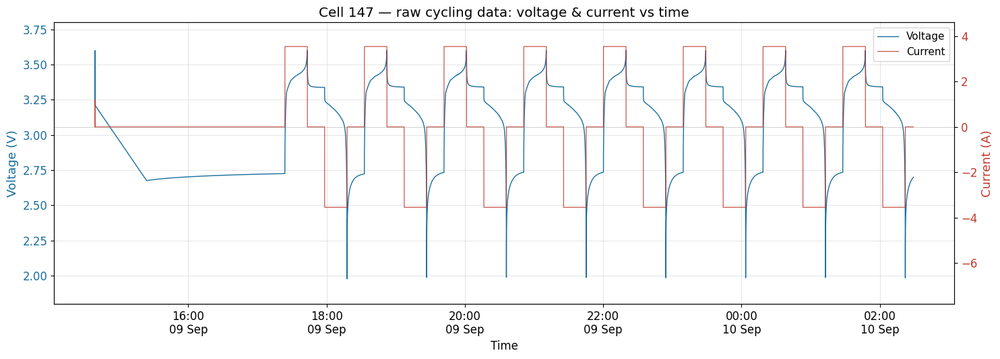

In [ ]:
# ===== V/I 循环图 v2:同一张图 + 跳过开头静置 + 更长窗口 =====
import re, numpy as np, pandas as pd
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

BID      = "147"
FILE_IDX = 0
N_HOURS  = 12      # 从循环开始算,显示多少小时(想更长就加大)
I_ACTIVE = 1.0     # 判定"循环开始"的电流幅值(A)

BASE = f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging = sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f],
               key=lambda f: re.search(r'(\d{4}-\d{2}-\d{2})', f.split('/')[-1]).group(1))
with fs.open(aging[FILE_IDX]) as fh:
    d = pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Prozedur']).to_pandas()
d = d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
d['Zeit'] = TS(d['Zeit'])

# --- 跳过开头静置:找到第一个 |I|>I_ACTIVE 且属于持续循环的点 ---
active = np.abs(d['Strom'].values) > I_ACTIVE
first = np.argmax(active)                      # 第一个活跃点
t_start = d['Zeit'].iloc[first] - pd.Timedelta(minutes=10)   # 留10分钟前置
dz = d[(d['Zeit'] >= t_start) &
       (d['Zeit'] <= t_start + pd.Timedelta(hours=N_HOURS))]
print(f"循环从 {d['Zeit'].iloc[first]} 开始, 窗口 {len(dz)} 点")

# --- 一张图,双y轴 ---
plt.rcParams.update({'font.size': 12})
fig, ax1 = plt.subplots(figsize=(15, 5.5))

ax1.plot(dz['Zeit'], dz['Spannung'], color='#1a6e9e', lw=1.0, label='Voltage')
ax1.set_ylabel('Voltage (V)', color='#1a6e9e', fontsize=13)
ax1.tick_params(axis='y', labelcolor='#1a6e9e')
ax1.set_ylim(1.8, 3.8)          # 给电压留满上半空间

ax2 = ax1.twinx()
ax2.plot(dz['Zeit'], dz['Strom'], color='#c0392b', lw=0.9, alpha=0.85, label='Current')
ax2.axhline(0, color='gray', lw=0.5, alpha=0.5)
ax2.set_ylabel('Current (A)', color='#c0392b', fontsize=13)
ax2.tick_params(axis='y', labelcolor='#c0392b')
imax = np.abs(dz['Strom']).max()
ax2.set_ylim(-imax*2.2, imax*1.3)  # 电流整体下移,和电压错开不打架

ax1.set_xlabel('Time')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M\n%d %b'))
ax1.set_title(f'Cell {BID} — raw cycling data: voltage & current vs time')
ax1.grid(alpha=0.3)

# 合并图例
l1,_ = ax1.get_legend_handles_labels(); l2,_ = ax2.get_legend_handles_labels()
ax1.legend(l1+l2, ['Voltage','Current'], loc='upper right', fontsize=11)

plt.tight_layout()
plt.savefig('raw_cycles_clean.png', dpi=200, bbox_inches='tight')
plt.show()

共检测到 286 个3C放电段, 聚焦第 2 和后 1 个


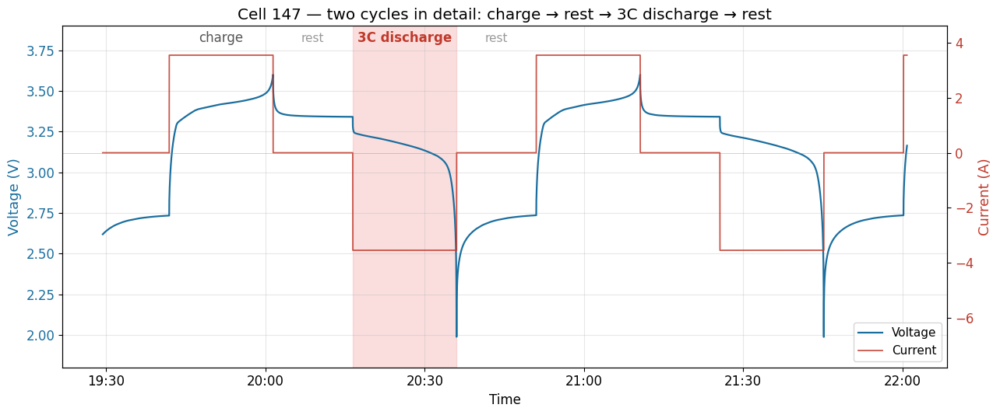

In [ ]:
# ===== v3: 聚焦1-2个循环 =====
import re, numpy as np, pandas as pd
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

BID      = "147"
FILE_IDX = 0
SEG_IDX  = 2       # 聚焦第几个3C放电段(0=第一个;第一个循环前有静置,建议取2)
N_CYCLES = 2       # 显示1个还是2个循环
ANNOTATE = True    # 是否标注 charge / rest / 3C discharge
MIN_SEG  = 10

# --- 阈值(与提取代码一致) ---
cap = pd.read_csv(f"s3://{CAP}/METABatt_A123_APR18650M1B_{BID}_capacity.csv",
                  storage_options=OPTS)
C_min = cap.dropna(subset=['Capacity_py'])['Capacity_py'].min()
I_thresh = 3 * C_min * 0.8

# --- 读数据 ---
BASE = f"{RAWBASE}/METABatt_A123_APR18650M1B_{BID}"
aging = sorted([f for f in fs.ls(BASE) if 'Aging' in f and 'Cyc' in f],
               key=lambda f: re.search(r'(\d{4}-\d{2}-\d{2})', f.split('/')[-1]).group(1))
with fs.open(aging[FILE_IDX]) as fh:
    d = pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Prozedur']).to_pandas()
d = d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
d['Zeit'] = TS(d['Zeit'])

# --- 检测3C放电段(与提取代码一致) ---
is_dch = (d['Strom'].values < -I_thresh)
diff = np.diff(is_dch.astype(int))
starts = np.where(diff==1)[0]+1; ends = np.where(diff==-1)[0]+1
if is_dch[0]:  starts = np.r_[0, starts]
if is_dch[-1]: ends   = np.r_[ends, len(d)]
segs = [(s,e) for s,e in zip(starts,ends) if e-s >= MIN_SEG]
print(f"共检测到 {len(segs)} 个3C放电段, 聚焦第 {SEG_IDX} 和后 {N_CYCLES-1} 个")

# --- 开窗:从选中段往前推一个循环周期,覆盖 N_CYCLES 个循环 ---
s0 = segs[SEG_IDX][0]; s_prev = segs[SEG_IDX-1][1] if SEG_IDX>0 else 0
e1 = segs[SEG_IDX + N_CYCLES - 1][1]
t_lo = d['Zeit'].iloc[s_prev] + (d['Zeit'].iloc[s0]-d['Zeit'].iloc[s_prev])*0.05
t_hi = d['Zeit'].iloc[min(e1+ (s0-s_prev)//4, len(d)-1)]
dz = d[(d['Zeit']>=t_lo) & (d['Zeit']<=t_hi)]

# --- 画图 ---
plt.rcParams.update({'font.size': 12})
fig, ax1 = plt.subplots(figsize=(13, 5.5))
ax1.plot(dz['Zeit'], dz['Spannung'], color='#1a6e9e', lw=1.6, label='Voltage')
ax1.set_ylabel('Voltage (V)', color='#1a6e9e', fontsize=13)
ax1.tick_params(axis='y', labelcolor='#1a6e9e')
ax1.set_ylim(1.8, 3.9)

ax2 = ax1.twinx()
ax2.plot(dz['Zeit'], dz['Strom'], color='#c0392b', lw=1.3, alpha=0.85, label='Current')
ax2.axhline(0, color='gray', lw=0.5, alpha=0.5)
ax2.set_ylabel('Current (A)', color='#c0392b', fontsize=13)
ax2.tick_params(axis='y', labelcolor='#c0392b')
imax = np.abs(dz['Strom']).max()
ax2.set_ylim(-imax*2.2, imax*1.3)

if ANNOTATE:
    seg = segs[SEG_IDX]
    t_dch0, t_dch1 = d['Zeit'].iloc[seg[0]], d['Zeit'].iloc[seg[1]-1]
    ax1.axvspan(t_dch0, t_dch1, color='#f4b6b6', alpha=0.45, zorder=0)

    # --- 精确找该循环的充电段:放电段之前最近的一段 I>阈值 ---
    is_chg = (d['Strom'].values > I_thresh*0.5)
    dc = np.diff(is_chg.astype(int))
    c_starts = np.where(dc==1)[0]+1; c_ends = np.where(dc==-1)[0]+1
    # 取结束位置在本放电段开始之前、且最靠近它的那个充电段
    prev_chg = [(cs,ce) for cs,ce in zip(c_starts,c_ends) if ce <= seg[0]]
    cs, ce = prev_chg[-1]
    t_chg0, t_chg1 = d['Zeit'].iloc[cs], d['Zeit'].iloc[ce-1]

    Y = 3.80   # 标签统一高度
    ax1.annotate('charge', xy=(t_chg0+(t_chg1-t_chg0)/2, Y),
                 ha='center', fontsize=12, color='#555')
    # rest 1:充电结束→放电开始
    ax1.annotate('rest', xy=(t_chg1+(t_dch0-t_chg1)/2, Y),
                 ha='center', fontsize=11, color='#999')
    ax1.annotate('3C discharge', xy=(t_dch0+(t_dch1-t_dch0)/2, Y),
                 ha='center', fontsize=12, fontweight='bold', color='#c0392b')
    # rest 2:放电结束→下一次充电开始
    next_chg = [cs2 for cs2 in c_starts if cs2 >= seg[1]]
    t_next = d['Zeit'].iloc[next_chg[0]] if next_chg else dz['Zeit'].iloc[-1]
    ax1.annotate('rest', xy=(t_dch1+(t_next-t_dch1)/2, Y),
                 ha='center', fontsize=11, color='#999')

ax1.set_xlabel('Time')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax1.set_title(f'Cell {BID} — {"one cycle" if N_CYCLES==1 else "two cycles"} in detail: '
              f'charge → rest → 3C discharge → rest')
ax1.grid(alpha=0.3)
l1,_=ax1.get_legend_handles_labels(); l2,_=ax2.get_legend_handles_labels()
ax1.legend(l1+l2, ['Voltage','Current'], loc='lower right', fontsize=11)

plt.tight_layout()
plt.savefig('raw_cycle_zoom.png', dpi=200, bbox_inches='tight')
plt.show()

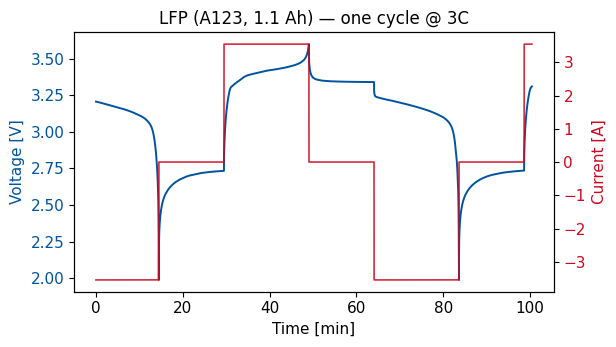

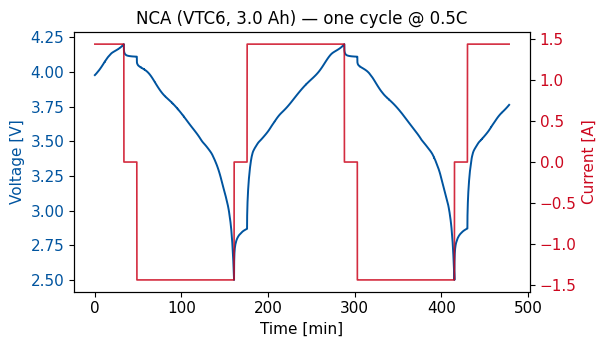

In [3]:
import s3fs, re, numpy as np, pandas as pd, pyarrow.parquet as pq
import matplotlib.pyplot as plt
from s3_credentials import S3_ACCESS_KEY, S3_SECRET_KEY

OPTS={"key":S3_ACCESS_KEY,"secret":S3_SECRET_KEY,
      "client_kwargs":{"endpoint_url":"https://iseadocker.isea.rwth-aachen.de:9000","region_name":"us-east-1"},
      "config_kwargs":{"s3":{"addressing_style":"path"},"signature_version":"s3v4"}}
fs=s3fs.S3FileSystem(**OPTS)
TS=lambda s: pd.to_datetime(s,format='ISO8601')
VBLUE='#00549F'; IRED='#CC071E'

def one_cycle(df, I_th):
    """定位一个完整循环: 取第2个放电段, 窗口=其前一个充电开始→该放电结束+静置"""
    I=df['Strom'].values
    dch=I<-I_th
    diff=np.diff(dch.astype(int))
    st=np.where(diff==1)[0]+1; en=np.where(diff==-1)[0]+1
    if dch[0]: st=np.r_[0,st]
    if dch[-1]: en=np.r_[en,len(df)]
    segs=[(s,e) for s,e in zip(st,en) if e-s>=10]
    s,e=segs[2]                                   # 第2个,避开文件开头静置
    # 往前找上一个充电(I>+I_th)的起点
    chg=np.where(I[:s]>I_th)[0]
    w0=chg[np.searchsorted(np.diff(chg),2)] if len(chg) else max(0,s-5000)
    # 简化:直接取该放电段前后各留一段
    span=e-s
    w0=max(0,s-int(span*2.5)); w1=min(len(df),e+int(span*0.5))
    return df.iloc[w0:w1]

def plot_vi(dz, title, fname):
    t=(dz['Zeit']-dz['Zeit'].iloc[0]).dt.total_seconds().values/60.0   # 分钟
    fig,ax1=plt.subplots(figsize=(6.2,3.6))
    ax1.plot(t,dz['Spannung'],color=VBLUE,lw=1.4)
    ax1.set_xlabel('Time [min]'); ax1.set_ylabel('Voltage [V]',color=VBLUE)
    ax1.tick_params(axis='y',labelcolor=VBLUE)
    ax2=ax1.twinx()
    ax2.plot(t,dz['Strom'],color=IRED,lw=1.2,alpha=0.85)
    ax2.set_ylabel('Current [A]',color=IRED)
    ax2.tick_params(axis='y',labelcolor=IRED)
    ax1.set_title(title,fontsize=12)
    plt.tight_layout()
    fig.savefig(fname,dpi=250,facecolor='white',bbox_inches='tight')
    plt.show()

plt.rcParams.update({'font.size':11})

# ---- LFP: Cell 147, 3C ----
BASE="projects/j8005-metabatt/Metabatt/A123/METABatt_A123_APR18650M1B_147"
f=sorted([x for x in fs.ls(BASE) if 'Aging' in x and 'Cyc' in x])[0]
with fs.open(f) as fh:
    d=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom','Prozedur']).to_pandas()
d=d[d['Prozedur'].str.contains('Aging_APR_Cyc')].reset_index(drop=True)
d['Zeit']=TS(d['Zeit'])
plot_vi(one_cycle(d,2.6), 'LFP (A123, 1.1 Ah) — one cycle @ 3C', 'slide4_lfp_cycle.png')

# ---- NCA: VTC6 025, 0.5C ----
KEY=("projects/j8005-metabatt/Metabatt/VTC/METABatt_Sony_Murata_18650VTC6_025/"
     "J8005_BMWK_METABatt=METABatt_Sony_Murata_18650VTC6_025=2024-09-09_124126="
     "jri_Aging_VTC6_Cyc_25grad_50SOC_100DOD_05C=TS012469 _ Format01="
     "Kreis M4-070=filesize-104013352=finished.parquet")
with fs.open(KEY) as fh:
    n=pq.ParquetFile(fh).read(columns=['Zeit','Spannung','Strom']).to_pandas()
n['Zeit']=TS(n['Zeit'])
plot_vi(one_cycle(n,1.0), 'NCA (VTC6, 3.0 Ah) — one cycle @ 0.5C', 'slide4_nca_cycle.png')